In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/My Drive/Colab Notebooks/imageCaptions'

!nvidia-smi


Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/imageCaptions
Thu Nov 26 15:27:03 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P8    32W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
        

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import os
import cv2
from pprint import pprint

import torch
from tqdm import tqdm_notebook as tqdm
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
from utils import save_checkpoint, load_checkpoint, print_examples
from MyDataloader import get_loader as my_get_loader
from model import EncoderDecoder
from model import *
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ROOT_FOLDER = "/content/drive/My Drive/Colab Notebooks/imageCaptions/flickr8k/images"

In [6]:
def disp_msg(split_type, length):
    print(f'{split_type} dataset: Total number of images {length} \nwith a total number of recordes {length*5}', end='\n')

# Data Collection

In [7]:
from collections import defaultdict
import json
import pandas as pd
from glob import glob

#Read the images 
actuall_images = glob('images/*')
actuall_images = [img.split('/')[-1] for img in actuall_images]

# for getting the split to train, test and validation Let's read the JSON file, and extract the data from it.
dataset_path = r'/content/drive/MyDrive/Colab Notebooks/imageCaptions/flickr8k/dataset.json'
dataset = json.load(open(dataset_path, 'r', encoding="utf8"))
split = defaultdict(list)
for img in dataset['images']:
    split[img['split']].append(img)


names = ['train', 'val', 'test']
total_images_from_dataset = 0
for name in names:
    split_values = split[f'{name}']
    df = pd.DataFrame.from_dict(split_values) 
    images_list = df['filename'].tolist()
    print("\n")
    display(df.head(10))
    print("\n")
    disp_msg(name, len(split_values))
    print("\n")
   




,sentids,imgid,sentences,split,filename
0,"[0, 1, 2, 3, 4]",0,"[{'tokens': ['a', 'black', 'dog', 'is', 'runni...",train,2513260012_03d33305cf.jpg
1,"[5, 6, 7, 8, 9]",1,"[{'tokens': ['a', 'little', 'baby', 'plays', '...",train,2903617548_d3e38d7f88.jpg
2,"[10, 11, 12, 13, 14]",2,"[{'tokens': ['a', 'brown', 'dog', 'in', 'the',...",train,3338291921_fe7ae0c8f8.jpg
3,"[15, 16, 17, 18, 19]",3,"[{'tokens': ['a', 'brown', 'dog', 'is', 'runni...",train,488416045_1c6d903fe0.jpg
4,"[20, 21, 22, 23, 24]",4,"[{'tokens': ['a', 'black', 'and', 'white', 'do...",train,2644326817_8f45080b87.jpg
5,"[25, 26, 27, 28, 29]",5,"[{'tokens': ['a', 'cyclist', 'wearing', 'a', '...",train,218342358_1755a9cce1.jpg
6,"[30, 31, 32, 33, 34]",6,"[{'tokens': ['a', 'man', 'dressed', 'in', 'a',...",train,2501968935_02f2cd8079.jpg
7,"[35, 36, 37, 38, 39]",7,"[{'tokens': ['a', 'boy', 'wearing', 'a', 'red'...",train,2699342860_5288e203ea.jpg
8,"[40, 41, 42, 43, 44]",8,"[{'tokens': ['a', 'girl', 'in', 'a', 'white', ...",train,2638369467_8fc251595b.jpg
9,"[45, 46, 47, 48, 49]",9,"[{'tokens': ['a', 'skier', 'in', 'a', 'yellow'...",train,2926786902_815a99a154.jpg




train dataset: Total number of images 6000 
with a total number of recordes 30000






,sentids,imgid,sentences,split,filename
0,"[30000, 30001, 30002, 30003, 30004]",6000,"[{'tokens': ['the', 'boy', 'laying', 'face', '...",val,2090545563_a4e66ec76b.jpg
1,"[30005, 30006, 30007, 30008, 30009]",6001,"[{'tokens': ['a', 'boy', 'in', 'a', 'blue', 't...",val,3393035454_2d2370ffd4.jpg
2,"[30010, 30011, 30012, 30013, 30014]",6002,"[{'tokens': ['a', 'lady', 'walking', 'her', 'd...",val,3695064885_a6922f06b2.jpg
3,"[30015, 30016, 30017, 30018, 30019]",6003,"[{'tokens': ['a', 'big', 'black', 'dog', 'jump...",val,1679557684_50a206e4a9.jpg
4,"[30020, 30021, 30022, 30023, 30024]",6004,"[{'tokens': ['two', 'woman', 'climbing', 'rock...",val,3582685410_05315a15b8.jpg
5,"[30025, 30026, 30027, 30028, 30029]",6005,"[{'tokens': ['a', 'child', 'is', 'laying', 'in...",val,1579798212_d30844b4c5.jpg
6,"[30030, 30031, 30032, 30033, 30034]",6006,"[{'tokens': ['a', 'group', 'of', 'people', 'ar...",val,269650644_059a84ece5.jpg
7,"[30035, 30036, 30037, 30038, 30039]",6007,"[{'tokens': ['four', 'children', 'are', 'playi...",val,2596619849_7b635dd310.jpg
8,"[30040, 30041, 30042, 30043, 30044]",6008,"[{'tokens': ['a', 'little', 'baby', 'skateboar...",val,2635164923_2a774f7854.jpg
9,"[30045, 30046, 30047, 30048, 30049]",6009,"[{'tokens': ['an', 'elderly', 'middle', 'easte...",val,3583321426_f373c52161.jpg




val dataset: Total number of images 1000 
with a total number of recordes 5000






,sentids,imgid,sentences,split,filename
0,"[35000, 35001, 35002, 35003, 35004]",7000,"[{'tokens': ['the', 'dogs', 'are', 'in', 'the'...",test,3385593926_d3e9c21170.jpg
1,"[35005, 35006, 35007, 35008, 35009]",7001,"[{'tokens': ['a', 'brown', 'and', 'white', 'do...",test,2677656448_6b7e7702af.jpg
2,"[35010, 35011, 35012, 35013, 35014]",7002,"[{'tokens': ['a', 'man', 'and', 'a', 'woman', ...",test,311146855_0b65fdb169.jpg
3,"[35015, 35016, 35017, 35018, 35019]",7003,"[{'tokens': ['a', 'couple', 'of', 'people', 's...",test,1258913059_07c613f7ff.jpg
4,"[35020, 35021, 35022, 35023, 35024]",7004,"[{'tokens': ['a', 'man', 'is', 'wearing', 'a',...",test,241347760_d44c8d3a01.jpg
5,"[35025, 35026, 35027, 35028, 35029]",7005,"[{'tokens': ['a', 'brown', 'dog', 'running'], ...",test,2654514044_a70a6e2c21.jpg
6,"[35030, 35031, 35032, 35033, 35034]",7006,"[{'tokens': ['a', 'girl', 'with', 'dark', 'bro...",test,2339106348_2df90aa6a9.jpg
7,"[35035, 35036, 35037, 35038, 35039]",7007,"[{'tokens': ['a', 'dog', 'with', 'its', 'mouth...",test,256085101_2c2617c5d0.jpg
8,"[35040, 35041, 35042, 35043, 35044]",7008,"[{'tokens': ['a', 'black', 'dog', 'emerges', '...",test,280706862_14c30d734a.jpg
9,"[35045, 35046, 35047, 35048, 35049]",7009,"[{'tokens': ['a', 'player', 'from', 'the', 'wh...",test,3072172967_630e9c69d0.jpg




test dataset: Total number of images 1000 
with a total number of recordes 5000




# Understanding the data

In [8]:
df = pd.DataFrame.from_dict(split['val']) 
for sentence in df.iloc[0]['sentences']:
    pprint(sentence)
    print('\n')

{'imgid': 6000,
 'raw': 'the boy laying face down on a skateboard is being pushed along the '
        'ground by another boy .',
 'sentid': 30000,
 'tokens': ['the',
            'boy',
            'laying',
            'face',
            'down',
            'on',
            'a',
            'skateboard',
            'is',
            'being',
            'pushed',
            'along',
            'the',
            'ground',
            'by',
            'another',
            'boy']}


{'imgid': 6000,
 'raw': 'Two girls play on a skateboard in a courtyard .',
 'sentid': 30001,
 'tokens': ['two',
            'girls',
            'play',
            'on',
            'a',
            'skateboard',
            'in',
            'a',
            'courtyard']}


{'imgid': 6000,
 'raw': 'Two people play on a long skateboard .',
 'sentid': 30002,
 'tokens': ['two', 'people', 'play', 'on', 'a', 'long', 'skateboard']}


{'imgid': 6000,
 'raw': 'Two small children in red shirts playing on a s

# Show random example
#image with her 5 captions

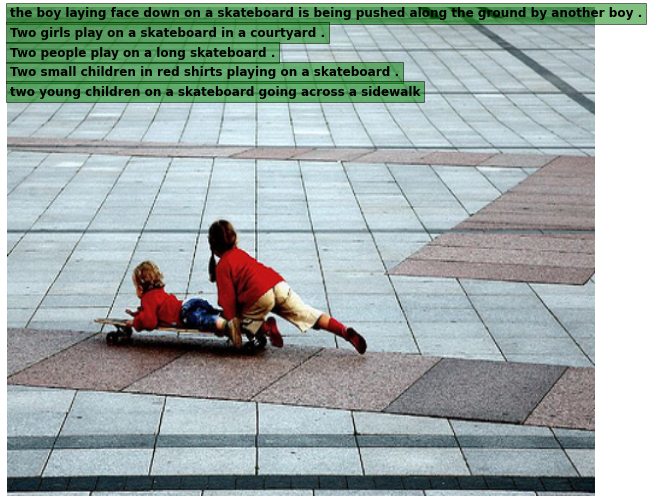

In [ ]:
def show_img(image_id):
    plt.figure(figsize=[15, 9])
    img = plt.imread(os.path.join(ROOT_FOLDER, image_id))
    img = cv2.resize(img, (600, 500))
    eps = 20 
    df = pd.DataFrame.from_dict(split['val']) 
    eps = 0
    for sentence in df.iloc[0]['sentences']:
        plt.text(2, 10 + eps, sentence['raw'], fontweight='bold', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
        eps += 20
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    
show_img('2090545563_a4e66ec76b.jpg')

In [9]:

def clean_sentence(sentence):
    for i, item in enumerate(sentence):
        if item == '<SOS>':
            sentence.remove(item)

        if item == '<EOS>':
            del sentence[i: len(sentence)] # also remove post [<PAD>] tokens
    return sentence

def blue_score(batch, dataset, show_output=False):
    n_grams_result = {
            '1-gram':[],
            '2-gram':[],
            '3-gram':[],
            '4-gram':[]
        }
    imgs, captions, imgs_id= batch[:3]
    smoothie = SmoothingFunction().method1
    results = {
            'image id':[],
            'kpi': [],
            'captions list': [],
            'output': []
    }
    with torch.no_grad():                 
        for i, img in enumerate(imgs):
            
            img = img.unsqueeze(0)
            captions_list = [clean_sentence([dataset.vocab.itos[idx.detach().cpu().item()] for idx in captions[:, i, j]]) for j in range(5)]
            output = clean_sentence(model.caption(img.to(device), train_dataset.vocab))

            gram1 = sentence_bleu(captions_list, output, weights=(1, 0, 0, 0), smoothing_function=smoothie)
            gram2 = sentence_bleu(captions_list, output, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
            gram3 = sentence_bleu(captions_list, output, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
            gram4 = sentence_bleu(captions_list, output, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)

            n_grams_result['1-gram'].append(gram1)
            n_grams_result['2-gram'].append(gram2)
            n_grams_result['3-gram'].append(gram3)
            n_grams_result['4-gram'].append(gram4)
            
            results['image id'].append(imgs_id[i])
            results['kpi'].append(
                {
                    '1-gram': gram1,
                    '2-gram': gram2,
                    '3-gram': gram3,
                    '4-gram': gram4
                }
            )
            results['captions list'].append(captions_list)
            results['output'].append(output)

            if show_output:
                print(f'Output: {" ".join(output)}')
                for i, cap in enumerate(captions_list):
                    print(f'option {i+1}: {" ".join(cap)}')
                print('\n')


        n_grams_result['1-gram'] = np.mean(np.array(n_grams_result['1-gram']))
        n_grams_result['2-gram'] = np.mean(np.array(n_grams_result['2-gram']))
        n_grams_result['3-gram'] = np.mean(np.array(n_grams_result['3-gram']))
        n_grams_result['4-gram'] = np.mean(np.array(n_grams_result['4-gram']))
        if show_output:
            print(n_grams_result)
            print('\n')
    return n_grams_result, results

# Transforms the images to shape 224X224 and normalize to ImageNet values

In [10]:

transform = transforms.Compose(
    [
        transforms.Resize(size=(224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406),
                                (0.229, 0.224, 0.225))
    ])

In [11]:
train_loader, train_dataset = my_get_loader(
                                    root_folder=ROOT_FOLDER,
                                    df= pd.DataFrame.from_dict(split['train']),
                                    transform=transform,
                                    batch_size=32,
                                    num_workers=4,
                                    shuffle=True)

val_loader, val_dataset = my_get_loader(
                                    root_folder=ROOT_FOLDER,
                                    df= pd.DataFrame.from_dict(split['val']),
                                    transform=transform,
                                    batch_size=32,
                                    num_workers=4,
                                    shuffle=False)

# Network Architecture
![](https://miro.medium.com/max/1500/1*ERwScS7k6IH3hZIJmGdHDg.png)

# Model parameters

Hyperparameters --- value

Learning rate --------- 1e-3

Batch size -------------- 32

Epochs ------------------- 150

Dropout rate ----------- 50%

Embedding size ------ 512

LSTM hidden size --- 512

LSTM num of lyayrs - 2




```
# loss
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"]) 

# optimizer
optimizer =  optim.Adam(model.parameters(), lr=learning_rate)
```





In [ ]:
torch.backends.cudnn.benchmark = True

 
load_model, train_CNN, save_model = False, False, True

# architecture hyperparameters set ups
embed_size, hidden_size, num_layers = 512, 512, 2
vocab_size = len(train_dataset.vocab)

# train hyperparameters
learning_rate = 1e-3
num_epochs = 150

# set tensorboard writer
writer = SummaryWriter(f'runs/run_for_graphs1')

# architecture
model =  EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device)

# loss function
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"]) 

# optimizer
optimizer =  optim.Adam(model.parameters(), lr=learning_rate)
scheduler = None

In [ ]:

def train_one_epoch(model, optimizer, dataloader, dataset, step, writer):
    kpi={
       'loss': [],
       '1-gram':[],
       '2-gram':[],
       '3-gram':[],
       '4-gram':[]
    }
    model.train()
    for idx, data in tqdm(
        enumerate(dataloader), total=len(dataloader)):
        ''' imgs shape [32, 3, 224, 224]
            captions shape [max sentence length, 32, 5] '''
        imgs, captions, _ = data[:3]
        max_length, batch_size, _ = captions.shape
        captions = captions.reshape(max_length, batch_size*5)

        imgs = imgs.to(device)
        captions = captions.to(device)
        imgs = torch.repeat_interleave(imgs, repeats=5, dim=0) #[a, b, c] -> [aaaaa, bbbbb, ccccc].T

        ''' imgs shape [160, 3, 224, 244]
            captions shape [max sentence length, 160] '''
        outputs = model(imgs, captions[:-1])

        loss = criterion(
            outputs.reshape(-1, outputs.shape[2]), captions.reshape(-1)
        )

        writer.add_scalar("Training loss", loss.item(), global_step=step)
        if idx == (len(dataloader) -1):
            print('\nTrain result\n')
            n_grams_result, _ = blue_score(data, dataset, show_output=True) #calculate blue score of the batch
        else:
            n_grams_result, _ = blue_score(data, dataset) #calculate blue score of the batch
        writer.add_scalar("1-gram bleu_train", n_grams_result['1-gram'] , global_step=step)
        writer.add_scalar("2-gram bleu_train", n_grams_result['2-gram'] , global_step=step)
        writer.add_scalar("3-gram bleu_train", n_grams_result['3-gram'] , global_step=step)
        writer.add_scalar("4-gram bleu_train", n_grams_result['4-gram'] , global_step=step)
        step += 1

        optimizer.zero_grad()
        loss.backward(loss)
        optimizer.step()

        kpi['loss'].append(loss.item())
        kpi['1-gram'].append(n_grams_result['1-gram'])
        kpi['2-gram'].append(n_grams_result['2-gram'])
        kpi['3-gram'].append(n_grams_result['3-gram'])
        kpi['4-gram'].append(n_grams_result['4-gram'])

    return model, optimizer, kpi, step, writer
for data in train_loader:
    imgs, captions, _ = data[:3]
    print(f'images shape: {imgs.shape}')
    print(f'captions shape: {captions.shape}')
    break

images shape: torch.Size([32, 3, 224, 224])
captions shape: torch.Size([27, 32, 5])


In [ ]:
def val_one_epoch(model, dataloader, dataset, step, writer):
    kpi={
       'loss': [],
       '1-gram':[],
       '2-gram':[],
       '3-gram':[],
       '4-gram':[]
    }
    model.eval()
    with torch.no_grad():
        for idx, data in tqdm(
        enumerate(dataloader), total=len(dataloader)):

            ''' imgs shape [32, 3, 224, 244]
            captions shape [max sentence length, 32, 5] '''

            imgs, captions, imgs_id = data[:3]
            max_length, batch_size, _ = captions.shape
            captions = captions.reshape(max_length, batch_size*5)

            imgs = imgs.to(device)
            captions = captions.to(device)
            imgs = torch.repeat_interleave(imgs, repeats=5, dim=0)

            ''' imgs shape [160, 3, 224, 244]
            captions shape [max sentence length, 160] '''

            outputs = model(imgs, captions[:-1])

            loss = criterion(
                outputs.reshape(-1, outputs.shape[2]), captions.reshape(-1)
            )
            if idx == (len(dataloader) -1):
                print('\nValidition result\n')
                n_grams_result, _ = blue_score(data, dataset, show_output=True) #calculate blue score of the batch
            else:
                n_grams_result, _ = blue_score(data, dataset) #calculate blue score of the batch

            writer.add_scalar("Validition loss", loss.item(), global_step=step)
            writer.add_scalar("1-gram bleu_val", n_grams_result['1-gram'] , global_step=step)
            writer.add_scalar("2-gram bleu_val", n_grams_result['2-gram'] , global_step=step)
            writer.add_scalar("3-gram bleu_val", n_grams_result['3-gram'] , global_step=step)
            writer.add_scalar("4-gram bleu_val", n_grams_result['4-gram'] , global_step=step)
            step += 1

            kpi['loss'].append(loss.item())
            kpi['1-gram'].append(n_grams_result['1-gram'])
            kpi['2-gram'].append(n_grams_result['2-gram'])
            kpi['3-gram'].append(n_grams_result['3-gram'])
            kpi['4-gram'].append(n_grams_result['4-gram'])

        return model, kpi, step, writer
for data in val_loader:
    imgs, captions, _ = data[:3]
    print(f'images shape: {imgs.shape}')
    print(f'captions shape: {captions.shape}')
    break
        

images shape: torch.Size([32, 3, 224, 224])
captions shape: torch.Size([34, 32, 5])


In [ ]:
# save_point = torch.load("/content/drive/MyDrive/Colab Notebooks/imageCaptions/run_for_graphs.pth.tar")

In [ ]:
# # def load_checkpoint(checkpoint, model, optimizer):
#     # print("=> Loading checkpoint")
# train_step = 0
# val_step = 0

# model.load_state_dict(save_point["state_dict"])
# optimizer.load_state_dict(save_point["optimizer"])
# train_step = save_point["train_step"]
# val_step = save_point["val_step"]
#     # return train_step, val_step
# num_epochs = num_epochs - int(train_step/len(train_loader))


# Train

In [1]:

train_step = 0
val_step = 0

for epoch in tqdm(range(num_epochs), total=num_epochs):
    print(f'epoch: [{epoch+1}/{num_epochs}]', end='\n')
    print_examples(model, device, train_dataset, 224)

    model.train()
    model, optimizer, train_kpi, train_step, writer = train_one_epoch(model, optimizer, train_loader, train_dataset, train_step, writer)
    model, val_kpi, val_step, writer = val_one_epoch(model, val_loader, val_dataset, val_step, writer)
    
    if save_model:
        checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "train_step": train_step,
            "val_step": val_step,
            'train_kpi': train_kpi,
            'val_kpi': val_kpi
        }
        save_checkpoint(checkpoint, filename="run_for_graphs.pth.tar")

    # %reload_ext tensorboard
    # %tensorboard --logdir {LOG_DIR}
    # if scheduler:
    #     scheduler.step()
    
writer.close()

#Inference section

In [12]:
save_point = torch.load("/content/drive/MyDrive/Colab Notebooks/imageCaptions/checkpoint_1120.pth.tar")
embed_size, hidden_size, num_layers = 512, 512, 2
vocab_size = len(train_dataset.vocab)
model =  EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers).to(device) 
model.load_state_dict(save_point["state_dict"]);

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/hub/checkpoints/resnet152-b121ed2d.pth


In [13]:
test_loader, test_dataset = my_get_loader(
                                    root_folder=ROOT_FOLDER,
                                    df= pd.DataFrame.from_dict(split['test']),
                                    transform=transform,
                                    batch_size=16,
                                    num_workers=4,
                                    shuffle=False)

In [14]:
test_prediction = {
            'image id':[],
            'kpi': [],
            'captions list': [],
            'output': []
    }

model.eval()
with torch.no_grad():
    for idx, data in tqdm(enumerate(test_loader), total=len(test_loader)):

        _, batch_result = blue_score(data, test_dataset) #calculate BLUE score of the batch [16X]   
        for key, values in batch_result.items():
            for l in values:
                test_prediction[f'{key}'].append(l)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # Remove the CWD from sys.path while we load stuff.


In [15]:
result_df = pd.DataFrame.from_dict(test_prediction)

# Test result

In [16]:
n_grams = {
    '1-gram':[],
    '2-gram':[],
    '3-gram':[],
    '4-gram':[]
}
for res in test_prediction['kpi']:
    for key, val in res.items():
        n_grams[f'{key}'].append(val)
n_grams = pd.DataFrame.from_dict(n_grams)
n_grams

,1-gram,2-gram,3-gram,4-gram
0,0.307692,0.050637,0.029600,0.021973
1,0.714286,0.468807,0.335789,0.240221
2,0.384615,0.179029,0.068119,0.041316
3,0.411765,0.050730,0.026753,0.018710
4,0.785714,0.549725,0.138793,0.069172
...,...,...,...,...
995,0.545455,0.073855,0.040572,0.029502
996,0.400000,0.066667,0.039424,0.029847
997,0.900000,0.707107,0.400535,0.172860
998,0.573112,0.228333,0.083005,0.049981


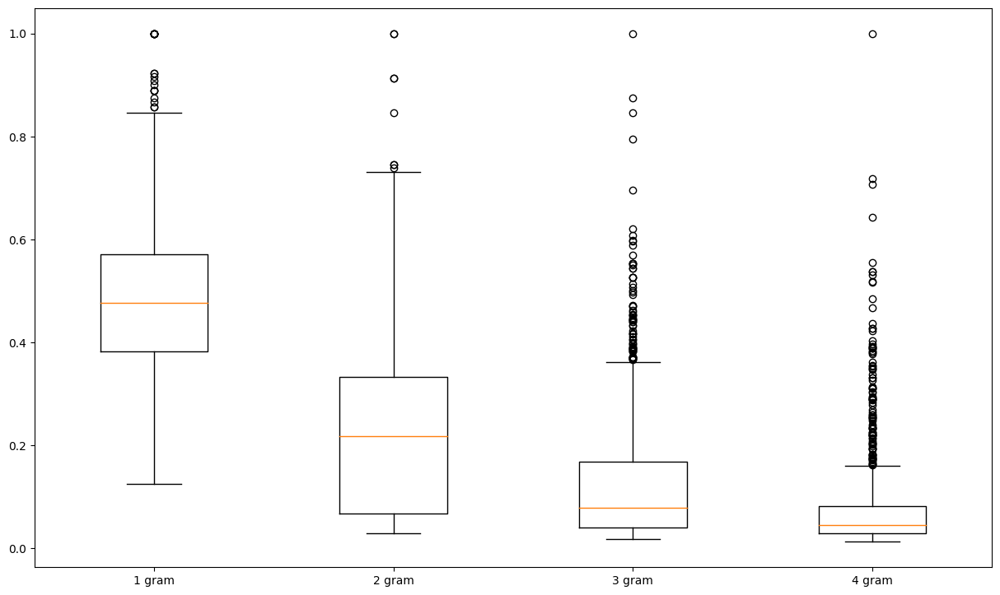

In [18]:
keys = n_grams.keys()
plt.figure(figsize=[15, 9], dpi=100)
labels = ['1 gram', '2 gram', '3 gram', '4 gram']
plt.boxplot([n_grams[key] for key in keys], labels=labels)#, fontsize=20)
plt.xticks()
plt.show()

In [19]:
def show_test_image(image_id):
    plt.figure(figsize=[15, 9])
    img = plt.imread(os.path.join(ROOT_FOLDER, image_id))
    img = cv2.resize(img, (600, 500))

    #show output
    output =str(" ".join(*result_df.loc[result_df['image id'] == image_id]['output'].to_list()))
    plt.text(2, 10, output, fontweight='bold', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    #show captions
    eps = 20 
    for caption in zip(*result_df.loc[result_df['image id'] == image_id]['captions list']):

        plt.text(2, 10 + eps, " ".join(caption[0]), fontweight='bold', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
        eps += 20
    
    #show BLUE score
    eps = 0
    values = result_df.loc[result_df['image id'] == image_id]['kpi'].values[0]
    for gram, val in values.items():
        n = gram.replace('-', ' ')
        plt.text(480, 420 + eps, f'{n}: {round(val, 5)}', fontweight='bold', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
        eps += 20
    plt.imshow(img)
    plt.axis('off')
    plt.show()


In [20]:
n_grams.describe()

,1-gram,2-gram,3-gram,4-gram
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.488320,0.239379,0.129634,0.078967
std,0.150254,0.166527,0.130623,0.094952
min,0.125000,0.029525,0.017825,0.012918
25%,0.383352,0.067420,0.040332,0.029847
50%,0.477688,0.217930,0.079548,0.046118
75%,0.571429,0.333372,0.169062,0.082487
max,1.000000,1.000000,1.000000,1.000000


In [21]:
#LRB - Low Range Boundry
#URB - Upper Range Boundry

mean, std = n_grams.describe()['1-gram'][['mean', 'std']][:2]
LRB = mean - std
URB = mean + std

low_indexes = n_grams.loc[n_grams['1-gram'] < LRB].index
meduim_indexes = n_grams.loc[(n_grams['1-gram'] >= LRB) & (n_grams['1-gram'] < URB)].index
hight_indexes = n_grams.loc[n_grams['1-gram'] >= URB].index


print(f'The mean value of 1 gram BLUE score is {round(mean, 5)} with standard deviation of {round(std, 5)}.\
\nMost of the values obtained will be between {round(LRB, 5)} and {round(URB, 5)}, the rest will called outliers')
print(f'Distribution result:\noutliers {len(low_indexes) + len(hight_indexes)} with , in range {len(meduim_indexes)}')
print(f'There is {len(low_indexes)} images lowwer then the lowwer standard deviation bound and {len(hight_indexes)} images greater than the upper bound std')


The mean value of 1 gram BLUE score is 0.48832 with standard deviation of 0.15025.
Most of the values obtained will be between 0.33807 and 0.63857, the rest will called outliers
Distribution result:
outliers 294 with , in range 706
There is 155 images lowwer then the lowwer standard deviation bound and 139 images greater than the upper bound std


# Unsuccessful prediction

In [22]:
from random import sample, seed

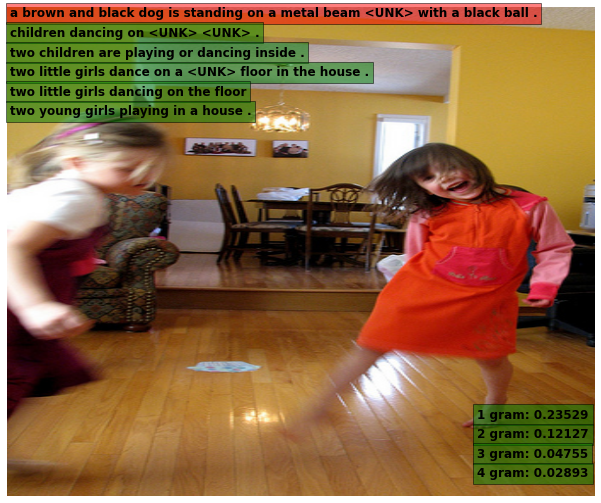

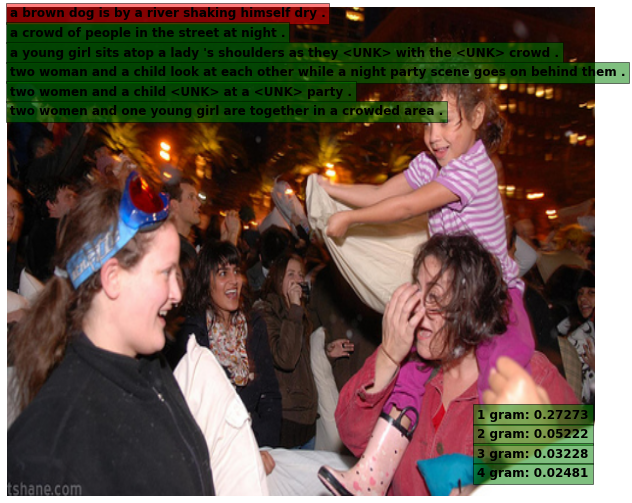

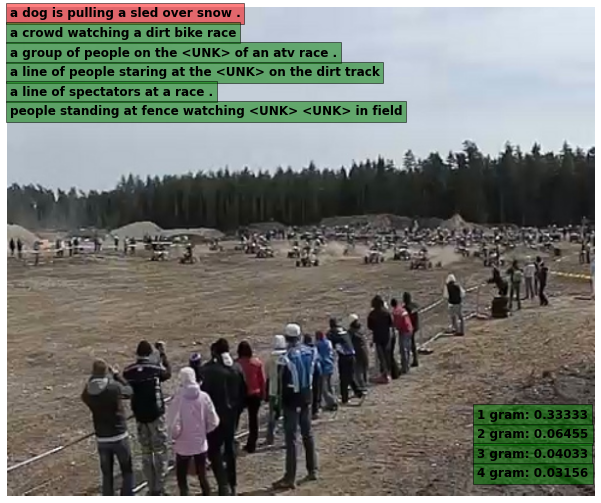

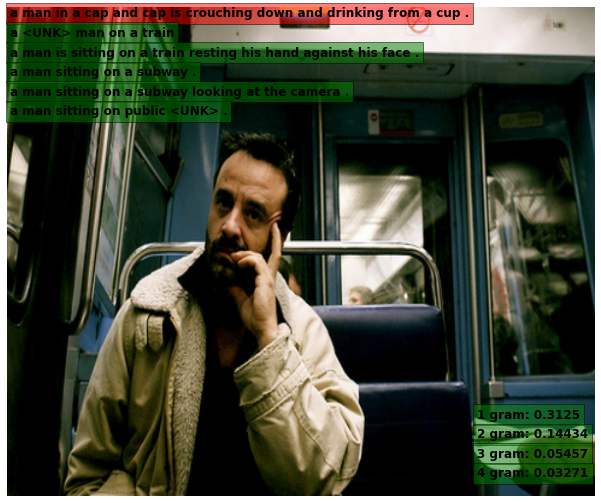

In [23]:
seed(0)
for i in sample(low_indexes.tolist(), 4):
    show_test_image(result_df.iloc[i]['image id'])

# Partly success


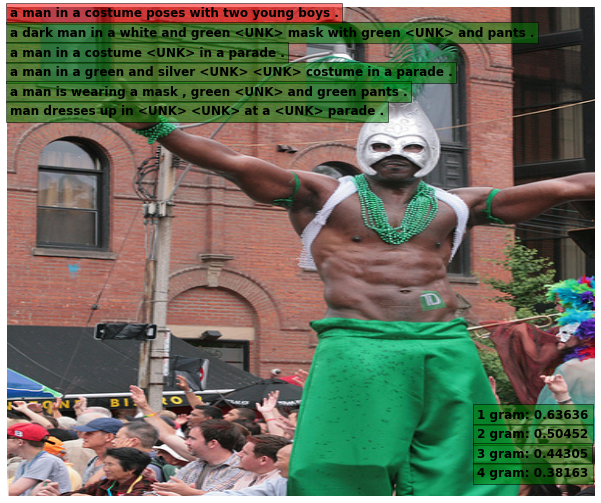

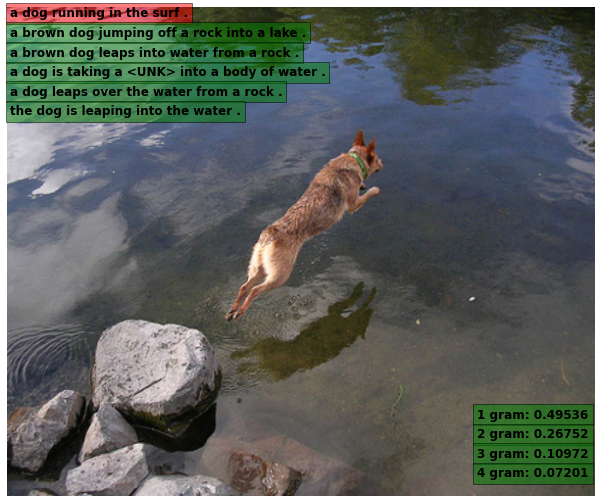

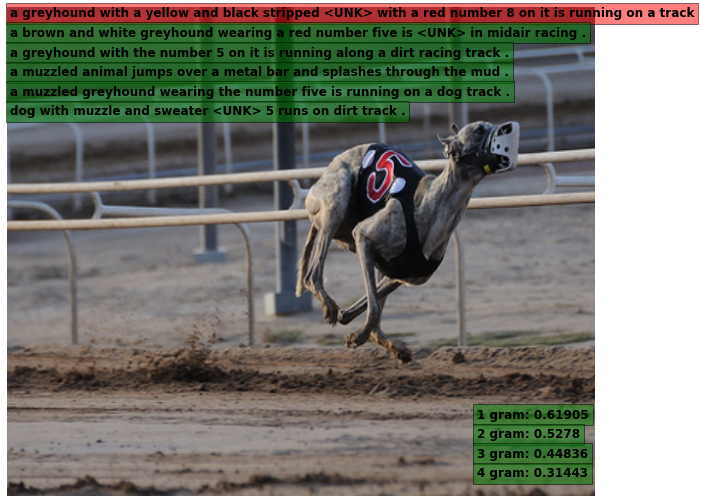

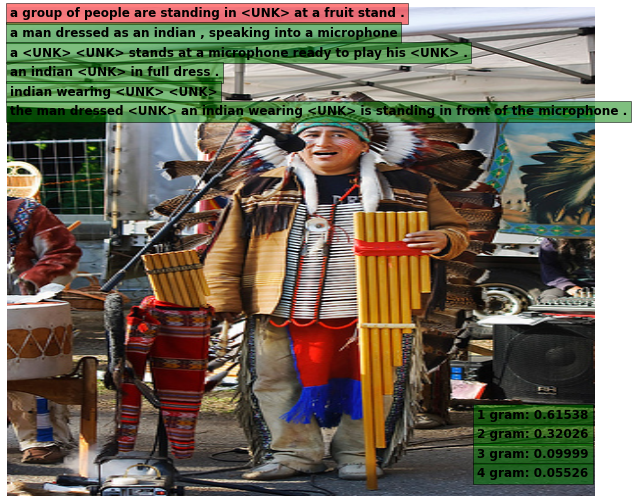

In [24]:
seed(5)
for i in sample(meduim_indexes.tolist(), 4):
    show_test_image(result_df.iloc[i]['image id'])

# Accurate description of the image


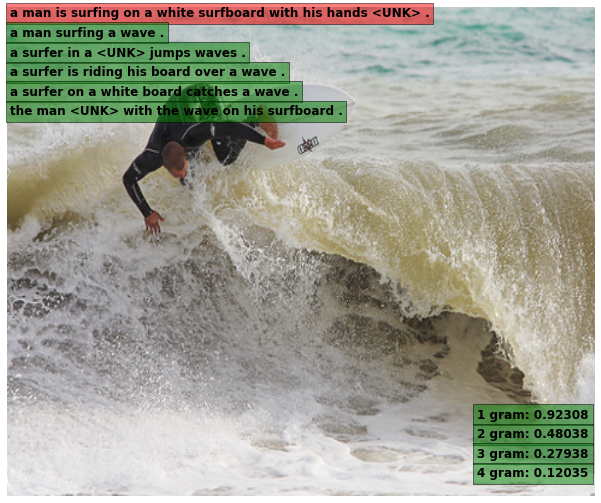

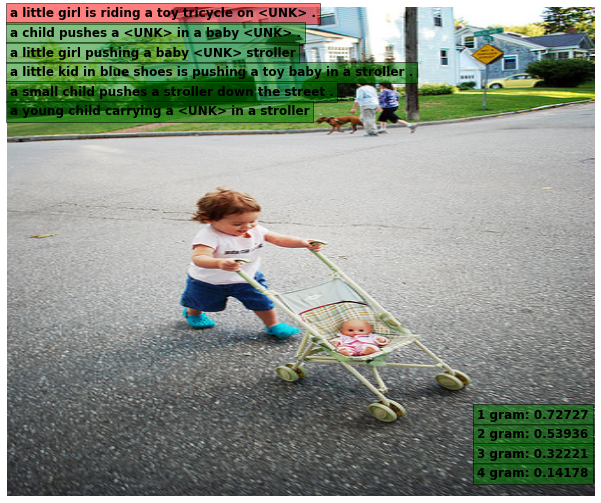

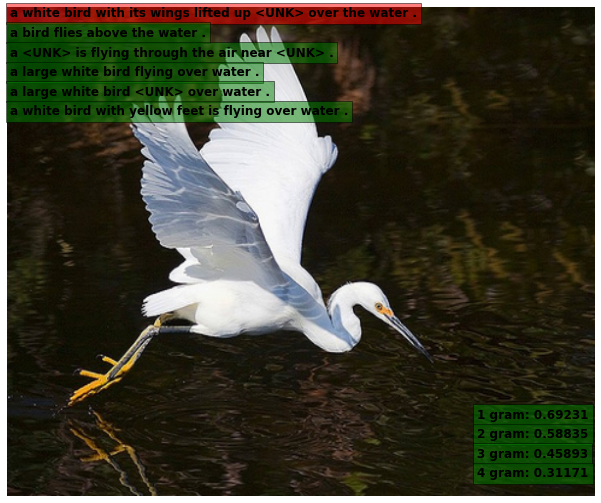

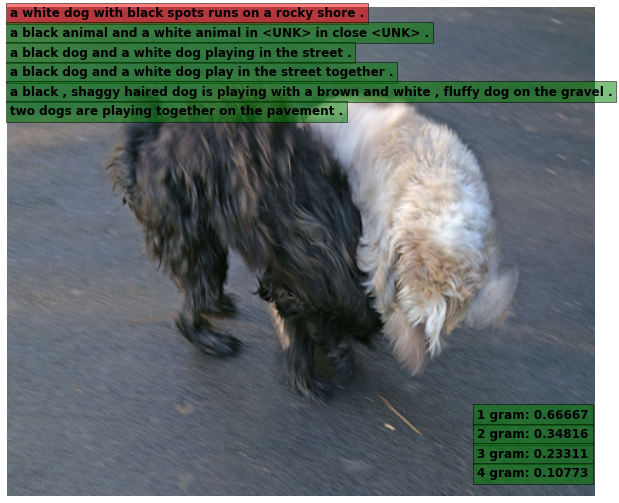

In [25]:
seed(3) 
for i in sample(hight_indexes.tolist(), 4):
    show_test_image(result_df.iloc[i]['image id'])

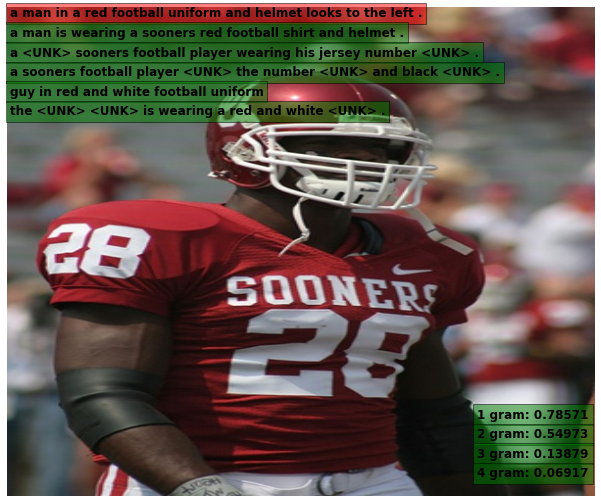

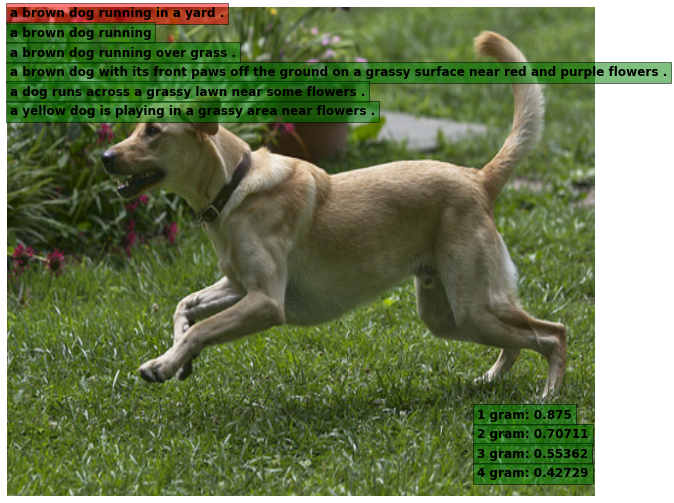

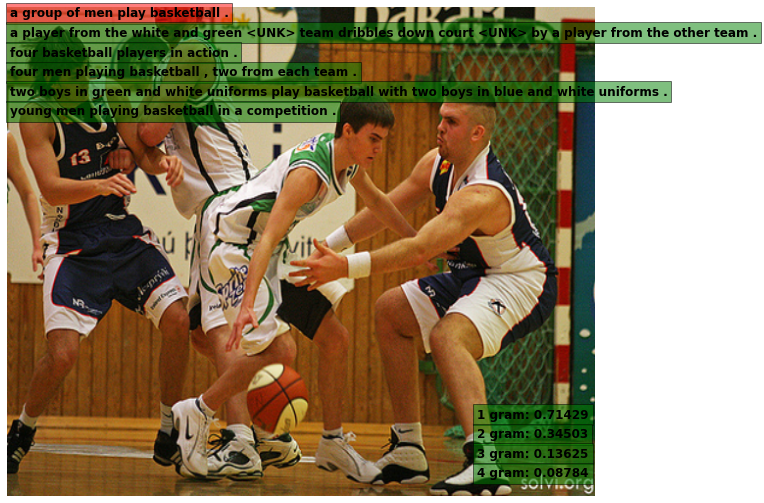

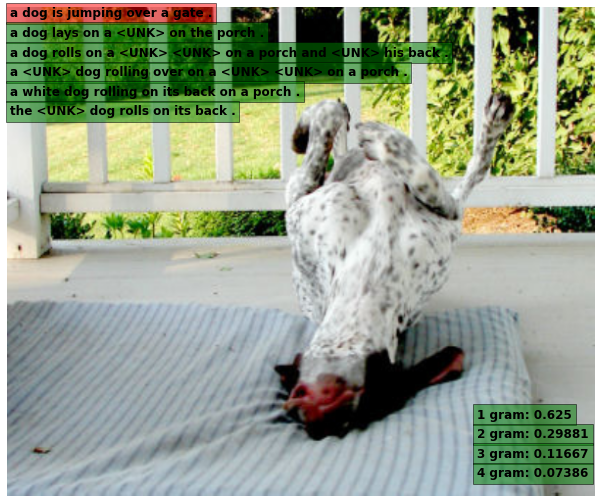

In [26]:
show_test_image('241347760_d44c8d3a01.jpg')
show_test_image('2654514044_a70a6e2c21.jpg')
show_test_image('3072172967_630e9c69d0.jpg')
show_test_image('2847615962_c330bded6e.jpg')